<div style="background-color: #add8e6; padding: 10px; color: black; padding-top: 2rem; padding-left: 1rem">

# Project Outline

</div>

# **Description**
We recognize the works of artists through their unique style, such as color choices or brush strokes. The “je ne sais quoi” of artists like Claude Monet can now be imitated with algorithms thanks to generative adversarial networks (GANs). In this getting started competition, you will bring that style to your photos or recreate the style from scratch!

Computer vision has advanced tremendously in recent years and GANs are now capable of mimicking objects in a very convincing way. But creating museum-worthy masterpieces is thought of to be, well, more art than science. So can (data) science, in the form of GANs, trick classifiers into believing you’ve created a true Monet? That’s the challenge you’ll take on!

# **Challenge**
A GAN consists of at least two neural networks: a generator model and a discriminator model. The generator is a neural network that creates the images. For our competition, you should generate images in the style of Monet. This generator is trained using a discriminator.

The two models will work against each other, with the generator trying to trick the discriminator, and the discriminator trying to accurately classify the real vs. generated images.

Your task is to build a GAN that generates 7,000 to 10,000 Monet-style images.

# Imports

In [1]:
import os
import time
import gc
import cv2
import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_addons as tfa
from tensorflow.keras import layers
from tensorflow.keras import Model
from tensorflow.keras.models import Sequential
from keras import backend as K

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZTVN10tenso

<div style="background-color: #add8e6; padding: 10px; color: black; padding-top: 2rem; padding-left: 1rem">

# Data Inspection (EDA Pt. 1)

</div>

The dataset contains four directories: monet_tfrec, photo_tfrec, monet_jpg, and photo_jpg. The monet_tfrec and monet_jpg directories contain the same painting images, and the photo_tfrec and photo_jpg directories contain the same photos.

We recommend using TFRecords as a Getting Started competition is a great way to become more familiar with a new data format, but JPEG images have also been provided.

The monet directories contain Monet paintings. Use these images to train your model.

The photo directories contain photos. Add Monet-style to these images and submit your generated jpeg images as a zip file. Other photos outside of this dataset can be transformed but keep your submission file limited to 10,000 images.

Note: Monet-style art can be created from scratch using other GAN architectures like DCGAN. The submitted image files do not necessarily have to be transformed photos.

Check out the CycleGAN dataset to experiment with the artistic style of other artists.

**Files**
* monet_jpg - 300 Monet paintings sized 256x256 in JPEG format
* monet_tfrec - 300 Monet paintings sized 256x256 in TFRecord format
* photo_jpg - 7028 photos sized 256x256 in JPEG format
* photo_tfrec - 7028 photos sized 256x256 in TFRecord format

In [2]:
dir_monet = "/kaggle/input/gan-getting-started/monet_jpg/"
dir_photo = "/kaggle/input/gan-getting-started/photo_jpg/"
files_monet = os.listdir(dir_monet)
files_photo = os.listdir(dir_photo)

n1 = len(files_monet)
n2 = len(files_photo)

In [3]:
print("Number of Monet images = ", n1)
print("Number of Landscape images = ", n2)

Number of Monet images =  300
Number of Landscape images =  7038


<div style="background-color: #add8e6; padding: 10px; color: black; padding-top: 2rem; padding-left: 1rem">

# Helper Functions (EDA Pt. 2)

</div>

# Function Summary
**convert_img**
* Takes an image input
* Converts the image using a specific formula. Adds 1 to each pixel and multiplies the result by 127.5 and then casts the values as ints
* Clips the pixel values to be in the range of [0, 255]
* Returns the overted images array as a uint8

**plot_photo**
* Takes an image input
* Converts the image using the same formula.
* Plots a 6x6 grid of subplots shows the images from the array
* Displays the plotted grid of images

**plot_OneLine**
* Takes an image, title and optional rescale value as input
* Converts the image using the same formula
* Plots a single line of subplots showing each image from the array and adds a title
* Displays a plotted line of images with a specific title

In [4]:
def convert_img(image):
    
    img2 = ((np.array(image) + 1)*127.5).astype(int)
    img2[img2 > 255] = 255
    img2[img2 < 0] = 0
    
    img2 = img2.astype(np.uint8)
    
    return img2

In [5]:
def plot_photo(image):
    
    img2 = ((np.array(image) + 1)*127.5).astype(int)
    img2[img2 > 255] = 255
    img2[img2 < 0] = 0

    
    fig, ax = plt.subplots(6,6, figsize = (15,15))
    
    N = 36
    for k in range(N):
        i =  int(k/6)
        j = k % 6
    
        ax[i,j].imshow(img2[k])
        ax[i,j].tick_params(left = False, right = False , labelleft = False , labelbottom = False, bottom = False)

In [6]:
def plot_OneLine(image, title, rescale = False):
    
    img2 = ((np.array(image) + 1)*127.5).astype(int)
    img2[img2 > 255] = 255
    img2[img2 < 0] = 0

    
    fig, ax = plt.subplots(1,6, figsize = (15,2.5))
    
    N = 6
    for k in range(N):
    
        ax[k].imshow(img2[k])
        ax[k].tick_params(left = False, right = False , labelleft = False , labelbottom = False, bottom = False)
        
    
    ax[0].set_title(title)

<div style="background-color: #add8e6; padding: 10px; color: black; padding-top: 2rem; padding-left: 1rem">

# Data Normalization (EDA Pt. 3)

</div>



# Summary
* Generate two 4d arrays and fill them with zeros
* Loop through dataset to load images from the directory into the m_data using OpenCV and reversed color channels
* Repeat the process for n2
* Normalized both data sets by dividing each pixel value 255/2 and then subtracting 1
* Generates two new arrays from the first 36 normalized samples

In [7]:
n2 = 100
M_data = np.zeros((n1,256,256,3)).astype(np.uint8)
F_data = np.zeros((n2,256,256,3)).astype(np.uint8)

for i in range(n1):
    M_data[i] = cv2.imread(dir_monet + files_monet[i])[:,:,::-1]
    
for i in range(n2):
    F_data[i] = cv2.imread(dir_photo + files_photo[i])[:,:,::-1]

M_data = M_data/(255/2) - 1
F_data = F_data/(255/2) - 1

real_A = M_data[0:36]
real_B = F_data[0:36]

<div style="background-color: #add8e6; padding: 10px; color: black; padding-top: 2rem; padding-left: 1rem">

# Data Visualization (EDA Pt. 4)

</div>

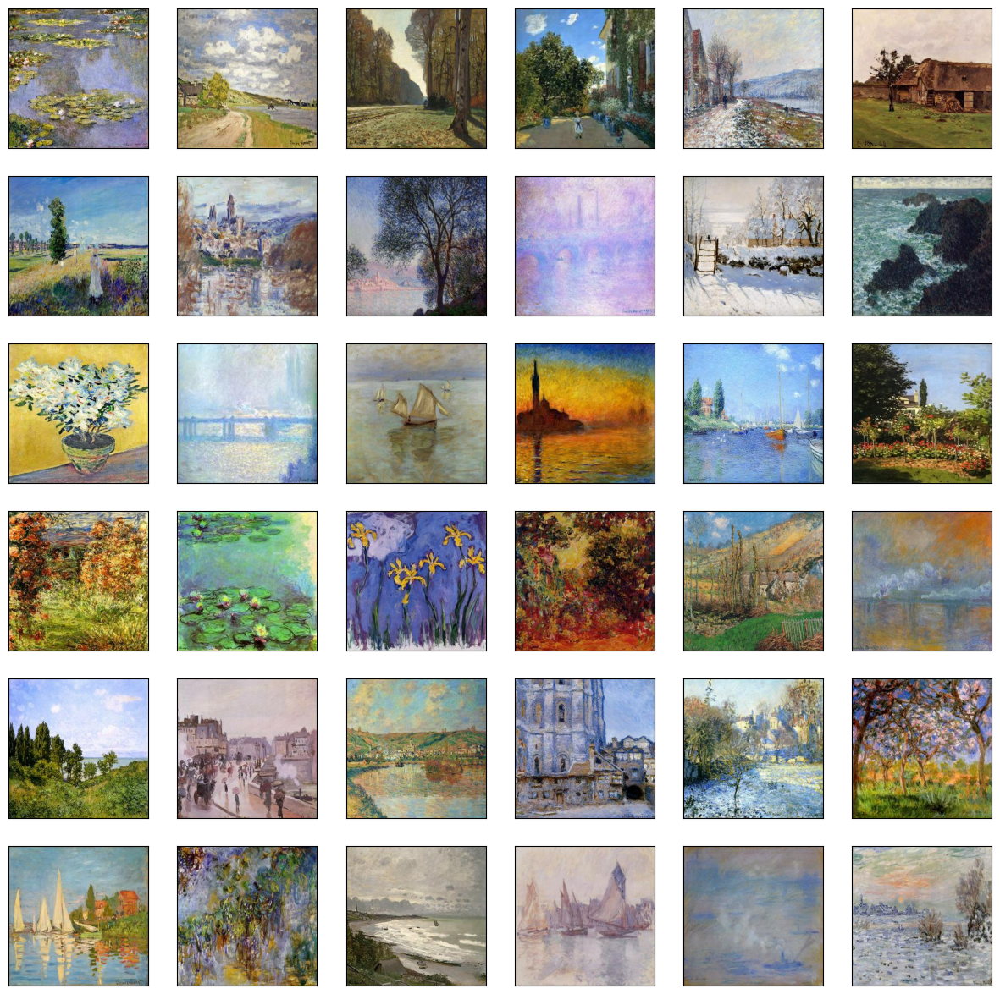

In [8]:
plot_photo(M_data)

**Landscape images**

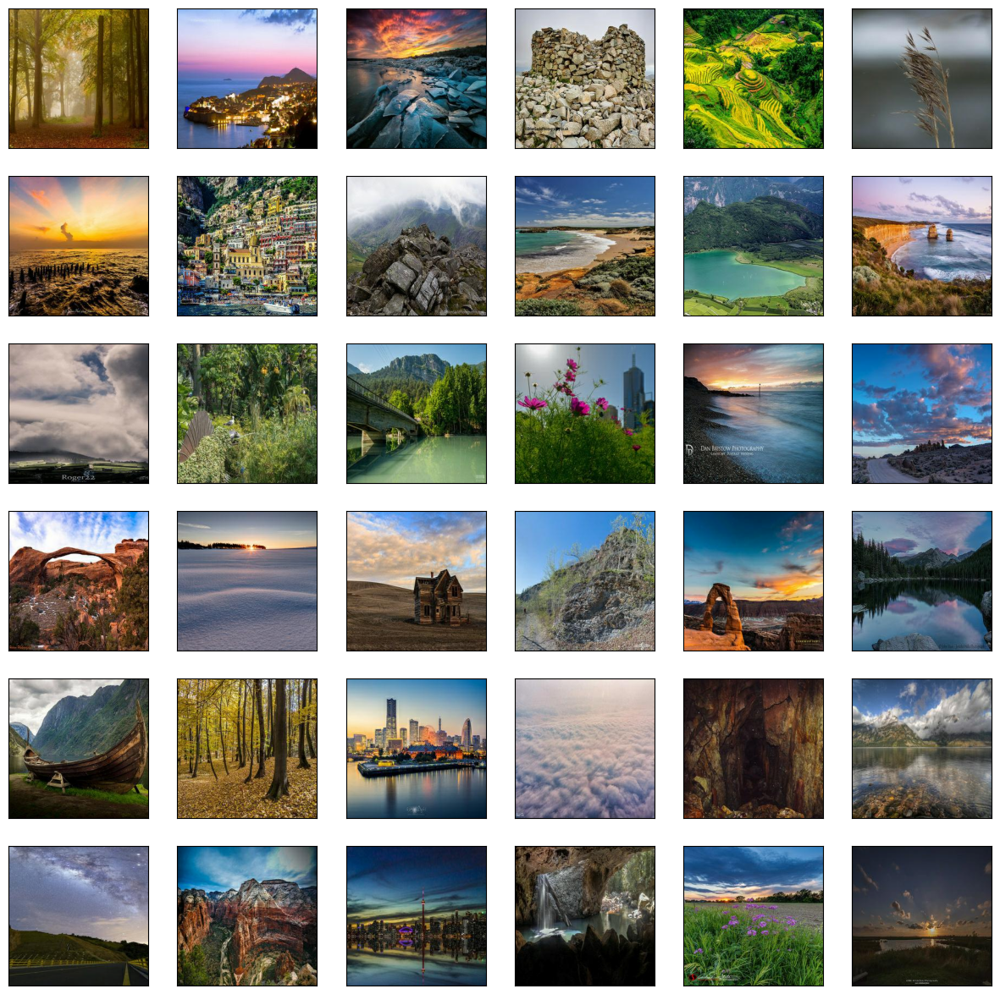

In [9]:
plot_photo(F_data)

<div style="background-color: #add8e6; padding: 10px; color: black; padding-top: 2rem; padding-left: 1rem">

# Model Architecture

</div>

**GAN Model**
* FeatureMapBlock
    * Takes in the number of output channels for the convolutional layer, input tensor and a bool flag for the final block
    * If in the final block, apply the convolutional layer with a Tanh activation
    * If not, applied the convolutional layer, instance normalization and leaky ReLU activation
    * Returns the processed tensor
    
* Contracting Block
    * Takes in the number of output channels for the convolutional layer, input tensor, bool flag for using relu activation, kernel size of the convo layer and bool flag on using instance normalization
    * Applies the convo layer with specific params
    * Optionally will apply instance normalization, ReLU / Leaky ReLU activation
    * Returns the processed tensor
    
* Residual Block
    * Takes in the number of output channels for the convolutional layer, input tensor, and a bool flag for using relu activation
    * Creates a residual block with a skip connection
    * Applies two convo layers followed by instance normalization and ReLU/ Leaky ReLU activation
    * Adds the original input tensor to the output
    * Returns the processed tensor
    
* Expanding Block
    * Takes in the number of output channels for the convolutional layer, input tensor, and the kernel size for the transposed convo layer
    * Applies a transposed convo layer with specific params
    * Also adds instance normalization and leaky ReLU activation
    * Returns the processed tensor
    
**Generator**
* Takes in a Keras input tensor with a shape of 256, 256, 3
* Uses an initial feature map block using the FeatureMapBlock func with 64 channels and assigns the final block to false
* Uses 4 contracting blocks with increasing channels
* Applies three residual blocks with 512 channels
* Uses 4 expanding blocks with decreasing channels
* Then uses a final feature map block with 3 output channels
* Returns a Keras model

**Discriminator**
* Takes in a KEras input tensors with a shape of 256, 256, 3
* Applies a feature map block with 64 channels
* Uses three contracting blocks with increasing channels
* Adds a 1x1 convo layer with single output channel
* Outputs a keras model

# GAN Model

In [10]:
def FeatureMapBlock(channel, X, final = False):
    if final:
        X = layers.Conv2D(channel, kernel_size = 7, padding = "same", activation = "tanh")(X)
    else:
        X = layers.Conv2D(channel, kernel_size = 7, padding = "same")(X)
        X = tfa.layers.InstanceNormalization()(X)
        X = layers.LeakyReLU(alpha=0.2)(X)
    return X

In [11]:
def ContractingBlock(channel, X, relu = True, ksize = 3, use_bn = True):
    X =  layers.Conv2D(channel, kernel_size = ksize, strides = 2, padding = "same")(X)
    if use_bn:
        X = tfa.layers.InstanceNormalization()(X)
    if relu:
        X = layers.ReLU()(X)
    else:
        X = layers.LeakyReLU(alpha=0.2)(X)
    return X

In [12]:
def ResidualBlock(channel, X, relu = True):
    X_original = X # skip connection
    X = layers.Conv2D(channel, kernel_size = 3, padding = "same")(X)
    X = tfa.layers.InstanceNormalization()(X)
    
    if relu:
        X = layers.ReLU()(X)
    else:
        X = layers.LeakyReLU(alpha=0.2)(X)

    X = layers.Conv2D(channel, kernel_size = 3, padding = "same")(X)
    X = tfa.layers.InstanceNormalization()(X)
    return X + X_original
    

In [13]:
def ExpandingBlock(channel, X, ksize):
    X = layers.Conv2DTranspose(channel, kernel_size=ksize, strides=2, padding="SAME")(X)
    X = tfa.layers.InstanceNormalization()(X)
    X = layers.LeakyReLU(alpha=0.2)(X)
    return X

# Generator

In [14]:
def Generator():
    Input =  layers.Input(shape=(256, 256, 3))
    channel = 64
    X = FeatureMapBlock(channel, Input, final = False)
    KS = 5
    X = ContractingBlock(channel*2, X, False, KS)#128
    X = ContractingBlock(channel*4, X, False, KS)#64
    X = ContractingBlock(channel*8, X, False, KS)#32
    X = ContractingBlock(channel*8, X, False, KS)#16
    X = ResidualBlock(channel*8, X, False)
    X = ResidualBlock(channel*8, X, False)
    X = ResidualBlock(channel*8, X, False)
    KS = 5
    X = ExpandingBlock(channel*8, X, KS)#32
    X = ExpandingBlock(channel*4, X, KS)#64
    X = ExpandingBlock(channel*2, X, KS)#128
    X = ExpandingBlock(channel, X, KS)#256
    X =  FeatureMapBlock(3, X, final = True)
    model = Model(inputs = Input, outputs = X)
    return model
    

In [15]:
gen_AB = Generator()
gen_BA = Generator()
gen_AB.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 64  9472        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 instance_normalization (Instan  (None, 256, 256, 64  128        ['conv2d[0][0]']                 
 ceNormalization)               )                                                             

# Discriminator

In [16]:
def Discriminator():
    Input =  layers.Input(shape=(256, 256, 3))
    channel = 64
    X = FeatureMapBlock(channel, Input, False) #
    X = ContractingBlock(channel*2, X, False, 4) #128
    X = ContractingBlock(channel*4, X, False, 4) #64
    X = ContractingBlock(channel*4, X, False, 4) #32
    X = layers.Conv2D(1, kernel_size = 1, padding = "same")(X) #32
    model = Model(inputs = Input, outputs = X)
    return model

disc_A = Discriminator()
disc_B = Discriminator()
disc_A.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv2d_24 (Conv2D)          (None, 256, 256, 64)      9472      
                                                                 
 instance_normalization_30 (  (None, 256, 256, 64)     128       
 InstanceNormalization)                                          
                                                                 
 leaky_re_lu_24 (LeakyReLU)  (None, 256, 256, 64)      0         
                                                                 
 conv2d_25 (Conv2D)          (None, 128, 128, 128)     131200    
                                                                 
 instance_normalization_31 (  (None, 128, 128, 128)    256       
 InstanceNormalization)                                    

<div style="background-color: #add8e6; padding: 10px; color: black; padding-top: 2rem; padding-left: 1rem">

# Loss Calculations

</div>

**get_disc_loss**
* Takes in the predictions of the discriminator for real and fake images and the adversarial loss criterion
* Creates label tensors for real and fake samples
* Calculates the discriminator loss using adversarial criterion
* Outputs the calculated discriminator loss

**get_gen_adversarial_loss**
* Takes in the predictions of the discriminator for the fake images and the adversarial loss criterion
* Creates a label tensor for the fake samples
* Calculates the adversarial loss for the generator
* Ouputs the adversarial loss for the generator

**get_cycle_consistency_loss**
* Takes in the real images, reconstructed data from the other domain through the generator and its inverse and the cycle consistency loss crterion
* Calculates the cycle consistency loss
* Outputs the calculated consistency loss

**get_identity_loss**
* Takes in the real images, reconstructed data from the generator without any transformations and hte identity loss criterion
* Calculates the identity loss
* Outputs the identity loss

# Discriminator Loss

In [17]:
def get_disc_loss(real_pred, fake_pred, adv_criterion):
    ones_label = tf.ones_like(real_pred)
    zeros_label = tf.zeros_like(fake_pred)
    disc_loss = (adv_criterion(ones_label, real_pred) + adv_criterion(zeros_label, fake_pred))/2
    return disc_loss

# Generator Loss


In [18]:
def get_gen_adversarial_loss(fake_pred, adv_criterion):
    ones_label = tf.ones_like(fake_pred)
    loss = adv_criterion(ones_label, fake_pred)
    return loss
   
def get_cycle_consistency_loss(real_X, cycle_X, cycle_criterion):
    cycle_loss = cycle_criterion(real_X, cycle_X)
    return cycle_loss 
    
def get_identity_loss(real_X, identity_X, identity_criterion):
    identity_loss = identity_criterion(real_X, identity_X)
    return identity_loss

<div style="background-color: #add8e6; padding: 10px; color: black; padding-top: 2rem; padding-left: 1rem">

# Hyperparameter Tuning

</div>

Several different factors were tuned in the GAN model and I have outlined them below.

**Activation Function**
* I chose to use a LeakyReLU in the generator and discriminator
* This helped with keeping information in dark areas and preventing blackouts

**ContractingBlocks in Generator**
* Found an optimal number of blocks to be 2 to account for stability and speed of training

**ResidualBlocks in Generator**
* Found an optimal number of blocks to be 3. Anything above this didn't really enhance the image quality

**Kernel Size of Discriminator**
* Size was set to 5 which appeared to be the most stable

**Learning Rate**
* Set it to 0.0002. Much above this I did not see improvements

**Adversarial Loss Function**
* Binary Cross Entropy worked better for me for my GAN model so I used that

In [19]:
optimizer_disc_A = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
optimizer_disc_B = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
optimizer_gen_AB = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
optimizer_gen_BA = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [20]:
loss_discA = []
loss_discB = []
loss_gen_AB = []
loss_gen_BA = []
loss_gen_adv_AB = []
loss_gen_adv_BA = []
loss_gen_cycle_ABA = []
loss_gen_cycle_BAB = []
loss_gen_iden_AB = []
loss_gen_iden_BA = []

BCE_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)
MSE_loss = tf.keras.losses.MeanSquaredError()
MAE_loss =  tf.keras.losses.MeanAbsoluteError()

adv_loss_function = BCE_loss

In [21]:
@tf.function
def train_CycleGan(real_A, real_B):
    lambda_cycle = 10
    lambda_identity = 2
    lambda_adv = 1
    disc_train_threshold = 0.35
    
    with tf.GradientTape() as tape:
        fake_A =  gen_BA(real_B)
        real_A_pred = disc_A(real_A)
        fake_A_pred = disc_A(fake_A)   
        disc_loss_A = get_disc_loss(real_A_pred, fake_A_pred, adv_loss_function)### MSE or BCE

    gradients = tape.gradient(disc_loss_A, disc_A.trainable_weights)
    optimizer_disc_A.apply_gradients(zip(gradients, disc_A.trainable_weights))
    
    
    with tf.GradientTape() as tape:
        fake_B = gen_AB(real_A)
        real_B_pred = disc_B(real_B)
        fake_B_pred = disc_B(fake_B)
        disc_loss_B = get_disc_loss(real_B_pred, fake_B_pred, adv_loss_function)### MSE or BCE        
        
    gradients = tape.gradient(disc_loss_B, disc_B.trainable_weights)    
    optimizer_disc_B.apply_gradients(zip(gradients, disc_B.trainable_weights))

    with tf.GradientTape(persistent=True) as tape:
        fake_A =  gen_BA(real_B)
        fake_B = gen_AB(real_A)
        cycle_A = gen_BA(fake_B)
        cycle_B = gen_AB(fake_A)
        iden_B = gen_AB(real_B)
        iden_A = gen_BA(real_A)
        fake_B_pred = disc_B(fake_B)
        fake_A_pred = disc_A(fake_A)

        gen_adversarial_loss_AB = get_gen_adversarial_loss(fake_B_pred, adv_loss_function)
        gen_adversarial_loss_BA = get_gen_adversarial_loss(fake_A_pred, adv_loss_function)
        cycle_loss_A = get_cycle_consistency_loss(real_A, cycle_A, MAE_loss)
        cycle_loss_B = get_cycle_consistency_loss(real_B, cycle_B, MAE_loss) 
        total_cycle_loss = cycle_loss_A + cycle_loss_B
        identity_loss_AB = get_identity_loss(real_B, iden_B, MAE_loss)
        identity_loss_BA = get_identity_loss(real_A, iden_A, MAE_loss)
        gen_loss_AB = gen_adversarial_loss_AB*lambda_adv + total_cycle_loss*lambda_cycle + identity_loss_AB*lambda_identity
        gen_loss_BA = gen_adversarial_loss_BA*lambda_adv + total_cycle_loss*lambda_cycle + identity_loss_BA*lambda_identity

    
    gradients = tape.gradient(gen_loss_AB, gen_AB.trainable_weights)
    optimizer_gen_AB.apply_gradients(zip(gradients, gen_AB.trainable_weights))
    gradients = tape.gradient(gen_loss_BA, gen_BA.trainable_weights)
    optimizer_gen_BA.apply_gradients(zip(gradients, gen_BA.trainable_weights))    
    
    del tape
    gc.collect()

In [22]:
def read_img(dir_name, file_name, convert = False):
    img = cv2.imread(dir_name + file_name)[:,:,::-1]
    if convert:
        img = img/(255/2) - 1
    return img

In [23]:
def Train_OneEpoch(EPOCH):
    time1 = time.time()
    print("EPOCH ", EPOCH)
    count = 0

    np.random.seed(EPOCH)
    m_idx = np.arange(n1)
    np.random.shuffle(m_idx)
    f_idx = np.arange(len(files_photo))
    np.random.shuffle(f_idx)

    for i in range(n1):
        F_data = read_img(dir_photo, files_photo[f_idx[i]], convert = True)
        M_data2 = M_data[m_idx[i]]
        if np.random.rand(1)[0] > 0.5:
            train_CycleGan(M_data2[:,::-1,:].reshape(1,256,256,3), F_data.reshape(1,256,256,3))
        else:
            train_CycleGan(M_data2.reshape(1,256,256,3), F_data.reshape(1,256,256,3))

        if (i+1) % 100 == 0:
            print(i+1)

    time2 = time.time()
    time3 = np.round(time2 - time1)
    print("time ", time3, "sec")
    

In [24]:
def check_output(EPOCH, plot_line, plot_all = False):
    real_A = M_data[0:36]
    real_B = F_data[0:36]
    fake_B = gen_AB(real_A)
    fake_A = gen_BA(real_B)
    cycle_A = gen_BA(fake_B)
    identity_A = gen_BA(real_A)
    cycle_B = gen_AB(fake_A)
    identity_B = gen_AB(real_B)
    tag = "_" + str(EPOCH)

    np.save("real_B", convert_img(real_B))
    np.save("fake_A" +tag, convert_img(fake_A))
    np.save("cycle_B" +tag, convert_img(cycle_B))
    np.save("identity_B" +tag, convert_img(identity_B))

    tag = ", epoch " + str(EPOCH)

    if plot_all:
        plot_photo(fake_A)
        
    if plot_line:
        plot_OneLine(real_B, "real_B")
        plot_OneLine(fake_A, "fake_A " + tag)
        plot_OneLine(cycle_B, "cycle_B " + tag)
        plot_OneLine(identity_B, "identity_B " + tag)          
            
    

In [25]:
def Train_Loop(EPOCH, EPOCH_prev):
    plot_line = True
    for i in range(EPOCH):
        Train_OneEpoch(i + EPOCH_prev)
        plot_line = False
        if (i + EPOCH_prev) % 5 == 0:   
            plot_line = True
            check_output(i + EPOCH_prev, plot_line, False)


<div style="background-color: #add8e6; padding: 10px; color: black; padding-top: 2rem; padding-left: 1rem">

# Model Training

</div>

In [26]:
N_EPOCH = 10

EPOCH  0
100
200
300
time  6469.0 sec


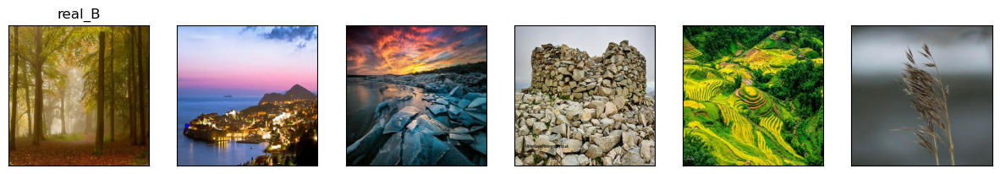

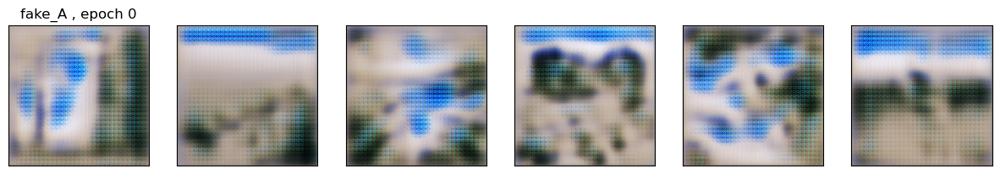

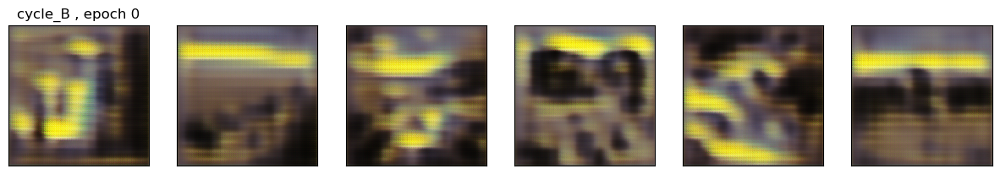

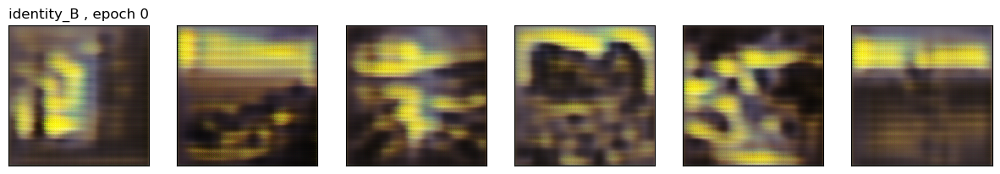

In [27]:
Train_Loop(N_EPOCH, 0)

In [28]:
gen_AB.save_weights("gen_AB/ckpt1")
gen_BA.save_weights("gen_BA/ckpt2")

In [29]:
disc_A.save_weights("disc_A/ckpt3")
disc_B.save_weights("disc_B/ckpt4")

<div style="background-color: #add8e6; padding: 10px; color: black; padding-top: 2rem; padding-left: 1rem">

# Model Output

</div>

Below is a sample subset of the output of my GAN that generates 7,000 to 10,000 Monet-style images

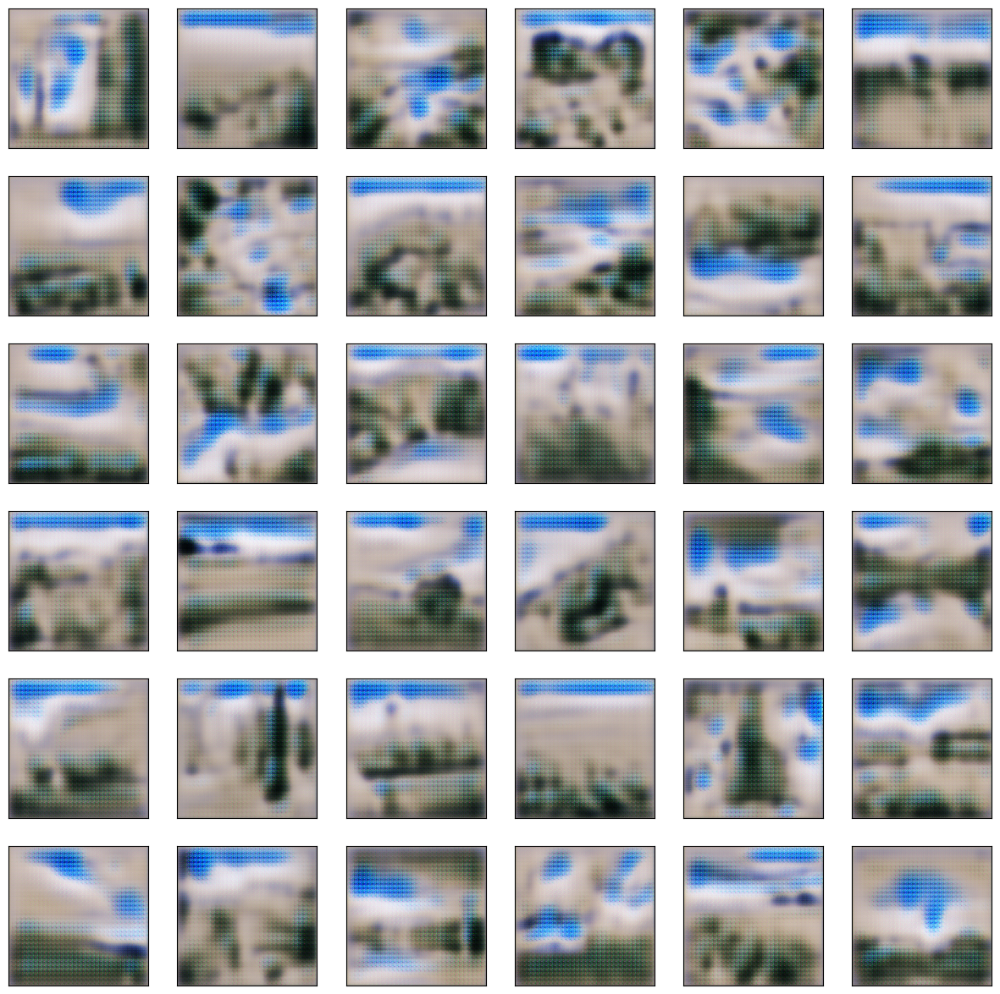

In [30]:
check_output(N_EPOCH, False, True)

<div style="background-color: #add8e6; padding: 10px; color: black; padding-top: 2rem; padding-left: 1rem">

# Image Submission

</div>

In [31]:
import PIL
! mkdir ../images

def submit_files():
    n3 = len(files_photo)
    
    for i in range(n3):
        real_F = cv2.imread(dir_photo + files_photo[i])[:,:,::-1].reshape(1,256,256,3)
        real_F = real_F/(255/2) - 1
        fake_A = np.array(gen_BA(real_F))[0]
        prediction = convert_img(fake_A).astype(np.uint8)
        im = PIL.Image.fromarray(prediction, mode="RGB")
        im.save("../images/" + str(i) + ".jpg")
    

In [32]:
submit_files()

In [33]:
import shutil
shutil.make_archive("/kaggle/working/images", 'zip', "/kaggle/images")

'/kaggle/working/images.zip'

<div style="background-color: #add8e6; padding: 10px; color: black; padding-top: 2rem; padding-left: 1rem">

# Conclusion

</div>

<ins>What I Learned / Key Takeaway</ins>\
Overall I believe my model performed well coming in at the target of a FID < 100. The CycleGAN worked and the color of the cycled images was closer to the original than the fake images. The landscape images didnt collapse when going through the generator monet-landscape which only showed some small color differences.

<ins>What Didn't Work</ins>\
The output itself had some color issues. Some of them appeared faded and rougher than the original images.

<ins>Ways To Improve</ins>\
I could start by exploring some ways to enhance the color and texture in my generated images to make them more similar to Monet's style. Next, I can always continue to experiment with my hyperparamters like the learning rates, weight loss etc to further improve the quality. I could also keep running some of the models and tuning the model based on the results each time through multple versions.